# Importing our necessary libraries

In [1]:
import tensorflow as tf
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix, accuracy_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import librosa
import librosa.display
import warnings
import os
warnings.filterwarnings('ignore')


## Downloading the GTZAN dataset from Kaggle

In [ ]:
# Note : If you are having problems downloading the 
# dataset with this way, refer to this link to download it manually : https://short-link.me/RGU5
try:
    !kaggle datasets download andradaolteanu/gtzan-dataset-music-genre-classification
except Exception as e:
    print("Error:", e)

from zipfile import ZipFile

try:
    with ZipFile("gtzan-dataset-music-genre-classification.zip", "r") as zip_file:
        zip_file.extractall()
except Exception as e:
    print("Error extracting file: ", e)


Dataset URL: https://www.kaggle.com/datasets/andradaolteanu/gtzan-dataset-music-genre-classification
License(s): other
403 - Forbidden
Error extracting file:  [Errno 2] No such file or directory: 'gtzan-dataset-music-genre-classification.zip'


# Visualizing our data



In [3]:
# Exploring the features of 3 seconds long music
df = pd.read_csv("Data/features_3_sec.csv")
df.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


<Axes: >

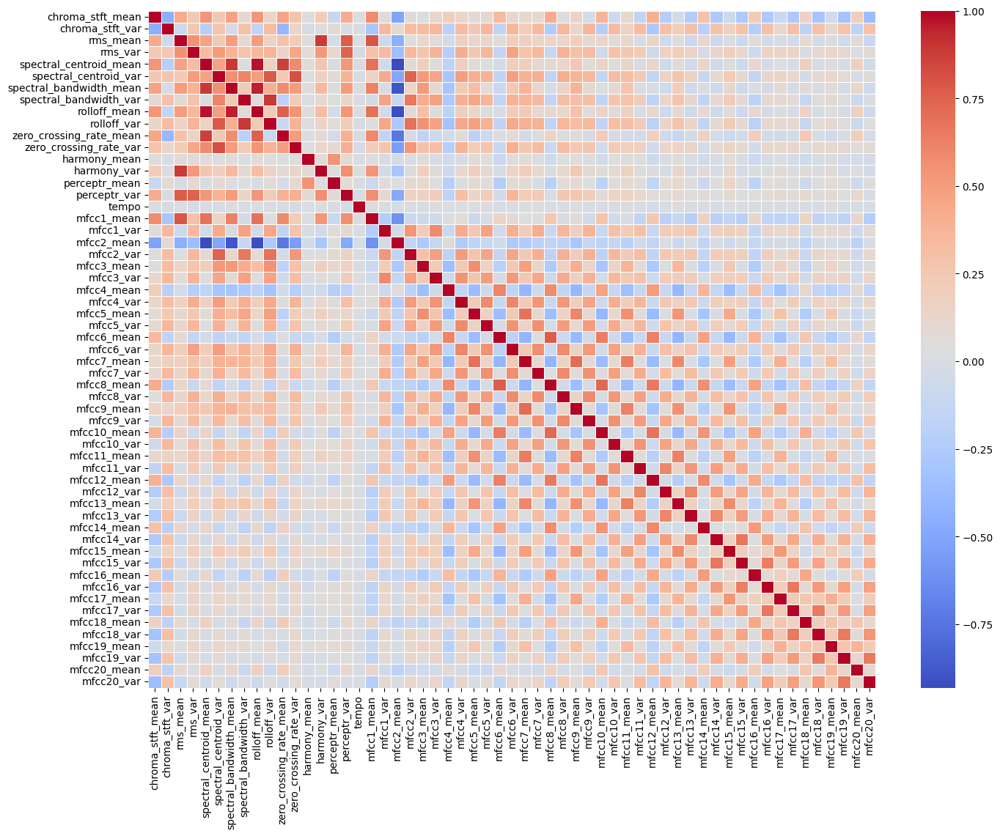

In [ ]:
# Plotting the correlation matrix
plt.figure(figsize=(16, 12))
features_correlation = df.drop(["label", "filename", "length"], axis=1).corr()
sns.heatmap(features_correlation, linewidths=0.5, fmt=".2f", cmap="coolwarm")

<Axes: >

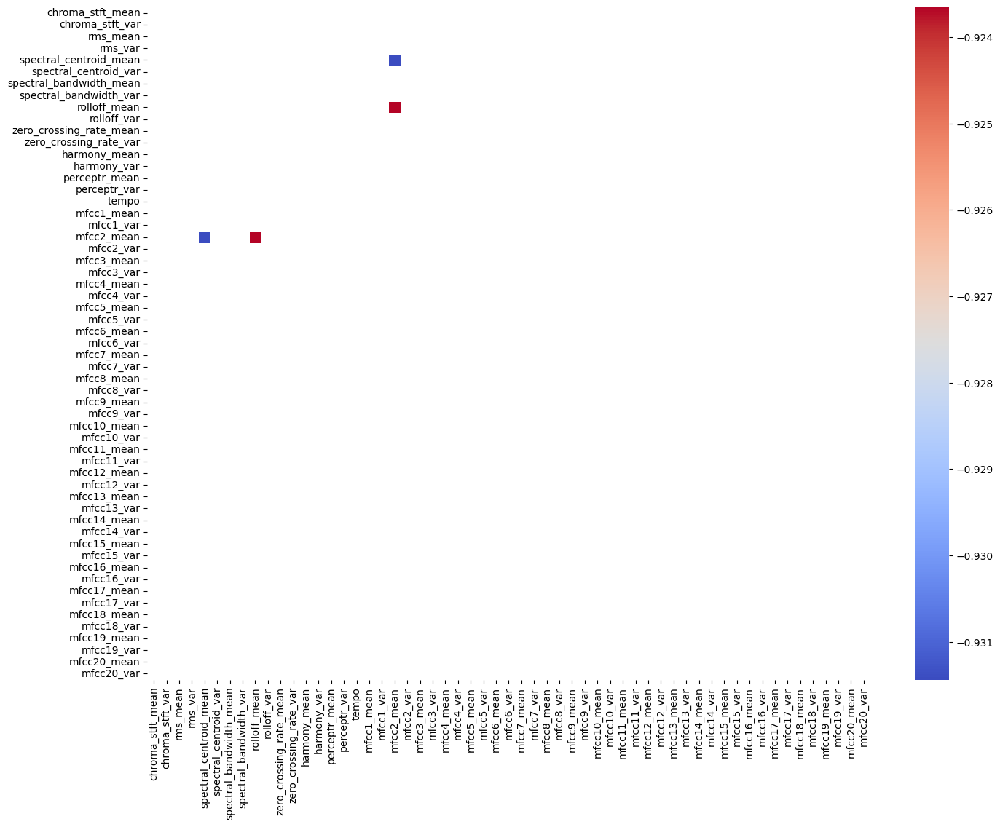

In [ ]:
# Highly negatively correlated features
plt.figure(figsize=(16, 12))
sns.heatmap(features_correlation[features_correlation < -0.90], linewidths=0.5, fmt=".2f", cmap="coolwarm")

<Axes: >

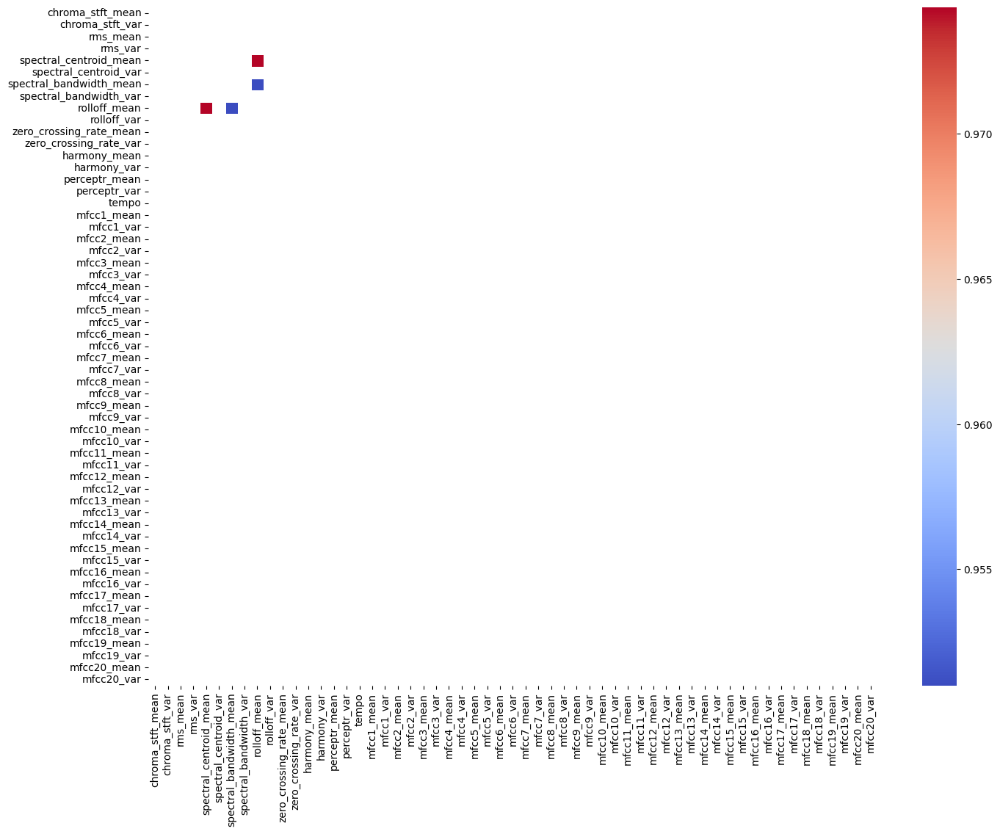

In [ ]:
# Highly positvely correlated features (excluding the same features)
plt.figure(figsize=(16, 12))
sns.heatmap(features_correlation[1 > features_correlation][features_correlation > 0.90], linewidths=0.5, fmt=".2f", cmap="coolwarm")

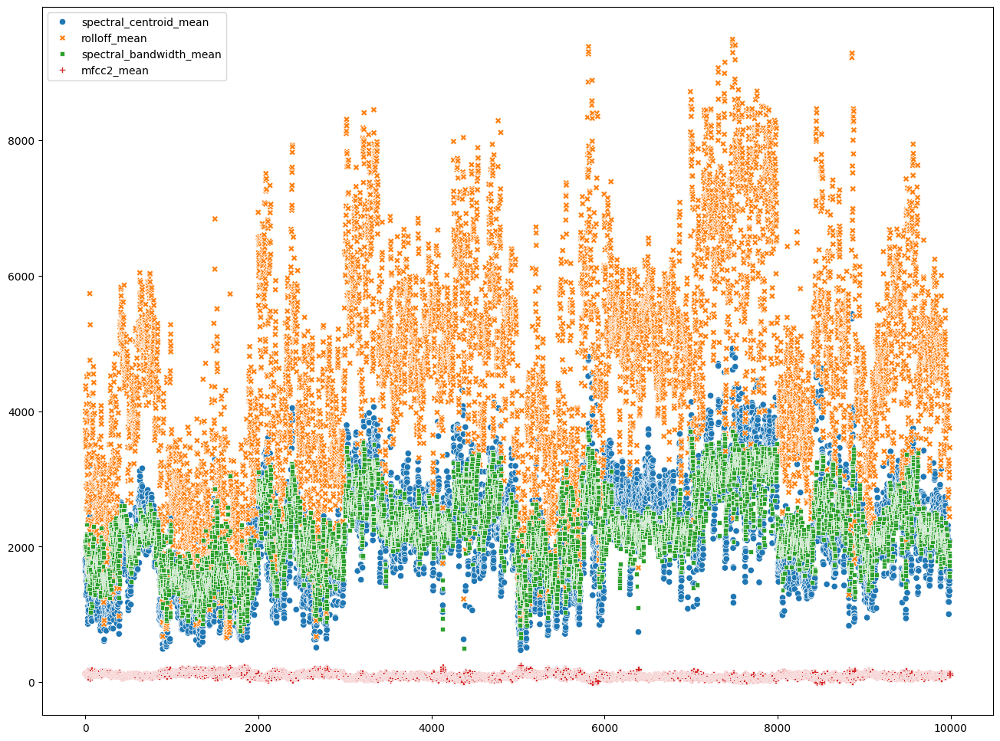

In [7]:
# Comparing some negatively correlated features with positively correlated features
plt.figure(figsize=(16, 12))
sns.scatterplot([df["spectral_centroid_mean"], df["rolloff_mean"], df["spectral_bandwidth_mean"], df["mfcc2_mean"]])
plt.show()

In [ ]:
dest_path = "Data/genres_original"
example_song_path = "blues/blues.00000.wav"
example = os.path.join(dest_path, example_song_path)

# Looking at a blues music example
audio_exm, sr = librosa.load(example)

print("Blues audio file as time series: ", audio_exm, "\n")
print("Sample rate(KHz): ", sr)

Blues audio file as time series:  [ 0.00732422  0.01660156  0.00762939 ... -0.05560303 -0.06106567
 -0.06417847] 

Sample rate(KHz):  22050


In [9]:
# Trimming leading and trailing silence from an audio signal(silence before and after the actual audio)
# In classification tasks we do this because noise does not
# provide meaningful information and interfer with the model's learning process
audio_exm, _ = librosa.effects.trim(audio_exm)

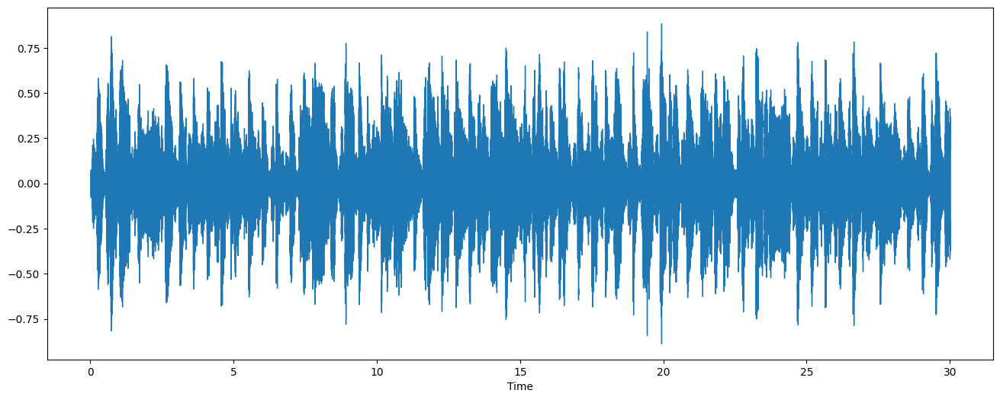

In [10]:
# Plotting the time series audio file
plt.figure(figsize = (16, 6))
librosa.display.waveshow(audio_exm, sr = sr)
plt.show()

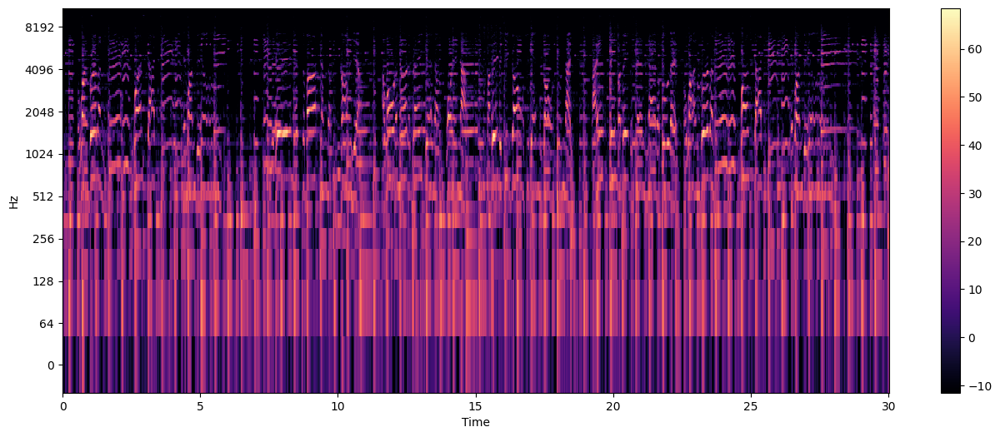

In [11]:
# Computing and plotting a mel-scaled spectrogram
hop_length = 512

plt.figure(figsize=(16, 6))

audio_melspec = librosa.feature.melspectrogram(y=audio_exm, sr = sr)
audio_melspec = librosa.amplitude_to_db(audio_melspec)

librosa.display.specshow(audio_melspec, sr = sr, hop_length = hop_length,
                         x_axis = "time", y_axis = "log", cmap = "magma")
plt.colorbar()
plt.show()

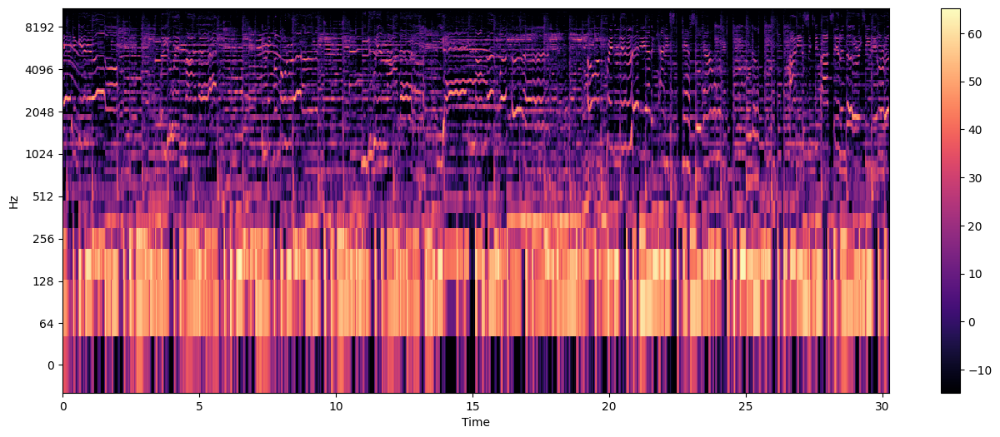

In [12]:
# Now plotting a mel-scaled Spectrogram of a country music example
plt.figure(figsize=(16, 6))

music_genre = "country"
audio_exm_path = os.path.join(dest_path, music_genre, "country.00005.wav")

audio_exm, sr = librosa.load(audio_exm_path)
librosa.effects.trim(audio_exm)

audio_melspec = librosa.feature.melspectrogram(y=audio_exm, sr = sr)
audio_melspec = librosa.amplitude_to_db(audio_melspec)

librosa.display.specshow(audio_melspec, sr = sr, hop_length = hop_length,
                         x_axis = "time", y_axis = "log", cmap = "magma")
plt.colorbar()
plt.show()

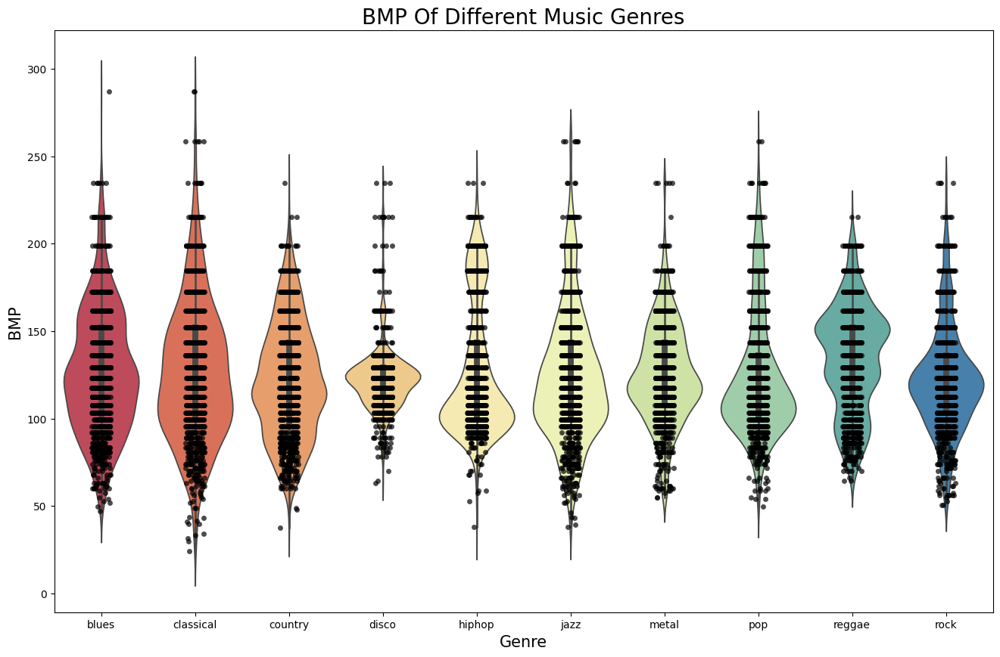

In [13]:
# Plotting the BMP( Beats Per Minute) and its data concentration in individual music genres
# which helps in differentiating between genres
vals = df[["label", "tempo"]]
plt.figure(figsize = (16, 10))

sns.violinplot(x = "label", y = "tempo", data = vals, palette="Spectral")
sns.stripplot(x="label", y="tempo", data=vals, color="k", alpha=0.7)
plt.title("BMP Of Different Music Genres", fontsize = 20)
plt.xlabel("Genre", fontsize = 15)
plt.ylabel("BMP", fontsize = 15)
plt.show()

In [14]:
features = df.drop(["label", "filename"], axis = 1)
labels = df["label"]

minmax = MinMaxScaler()
scaled_features = minmax.fit_transform(features)
scaled_features_df = pd.DataFrame(scaled_features, columns = features.columns)

scaled_features_df.head()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
0,0.0,0.355399,0.716757,0.293133,0.107955,0.262173,0.034784,0.459205,0.094130,0.346153,...,0.363613,0.056198,0.397172,0.066062,0.371828,0.055344,0.380831,0.026797,0.506746,0.047781
1,0.0,0.367322,0.670347,0.253040,0.044447,0.270969,0.018716,0.470831,0.052261,0.363722,...,0.468596,0.092912,0.351681,0.074001,0.362068,0.076365,0.418452,0.082414,0.593029,0.065548
2,0.0,0.373159,0.728067,0.296753,0.141663,0.265293,0.023073,0.494051,0.059922,0.378215,...,0.479681,0.096704,0.420979,0.050639,0.400536,0.067509,0.433742,0.043841,0.546264,0.036062
3,0.0,0.399349,0.677066,0.298024,0.075042,0.238427,0.023187,0.455246,0.066234,0.329587,...,0.386258,0.067995,0.387474,0.050617,0.380430,0.050030,0.405824,0.041898,0.562204,0.034873
4,0.0,0.355668,0.689113,0.322308,0.052149,0.233460,0.016451,0.451651,0.047830,0.318453,...,0.438567,0.042500,0.460314,0.083860,0.388590,0.076524,0.409019,0.020763,0.517913,0.031713


In [ ]:
# Applying PCA (Principal component analysis) a linear dimensionality reduction technique 
# that summarizes data into high variance components
pca = PCA(n_components=3)
pca_features = pca.fit_transform(scaled_features_df)
pca_features_df = pd.DataFrame(pca_features, columns=["pca_1", "pca_2", "pca_3"])

pca_features_df.head()

,pca_1,pca_2,pca_3
0,-0.242167,0.121147,0.071058
1,-0.276062,0.230291,0.038987
2,-0.190024,0.119509,0.067502
3,-0.278550,0.167689,0.052075
4,-0.309771,0.187990,0.029072


In [16]:
# Combining principal components with labels for visualization
pca_data_df = pd.concat([pca_features_df, labels], axis = 1)
pca.explained_variance_ratio_

array([0.26745621, 0.18238003, 0.08093668])

In [17]:
import plotly.express as px

# 3d visaulization of 3 extracted principal components on music genres
fig = px.scatter_3d(pca_data_df, x='pca_1', y='pca_2', z='pca_3', color = labels,
                    title = "PCA On Genres")
fig.update_layout
fig.show()

# Adding Spectral Flux to data

In [ ]:
# Extracting more features (Spectral Flux Mean and Spectral Flux Var)
# to add to our data for better model generalization and performance
from tqdm import tqdm

hop_length = 512
music_path = "Data/genres_original"
segments = []
segment_duration = 3
num_segments = 10
batch_size = 50

# A dictionary for storing spectral flux features
flux_dict = {
    "filename": list(),
    "spectral_flux_mean": list(),
    "spectral_flux_var": list(),
    "label": list(),
}

def load_song(genre_path, song_name):
    '''
    Load an audio file using librosa load method
    then return its data, sample rate and its path as
    a python dictionary.
    
    Parameters
    ----------
    genre_path : Song's genre path. for example genres_original/blues
    song_name : Name of the song
    '''
    song_path = os.path.join(genre_path, song_name)
    try:
        song_data, sr = librosa.load(song_path)
        return {"audio_data": song_data, "sample_rate": sr, "song_path": song_path}
    except Exception as e:
        print("Error: ", e)
        print("Skipping problamatic file: ", song_path)
        
def prepare_filename(song_path, song_num):
    '''
    Prepare new song file name for each segment of song to
    match "filename" column in "features_3_sec.csv"
    file for adding new data in the right order.
    
    Parameters
    ----------
    song_path : Song's path for making the new file name. for example genres_original/blues/blues.00000.wav
    song_num : a number from 0 to 9 to add to each segment of 
    the original 30 second song for example "blues.00000.9.wav" is the ninth split
    '''
    split_name = os.path.basename(song_path).split(".")
    song_ext = split_name.pop()
    split_name.append(str(song_num))
    split_name.append(song_ext)
    filename = ".".join(split_name) 
    return filename   
    
# Looping through each song and extracting Spectral Flux Mean and Spectral Flux Var
for genre in os.listdir(music_path):
    genre_path = os.path.join(music_path, genre)
    print(f"{genre}:")
    genre_list = os.listdir(genre_path)
    
    for start in range(0, len(genre_list), batch_size):
        batch = genre_list[start: start + batch_size]
        
        for song_name in tqdm(batch):
            song_data = load_song(genre_path=genre_path, song_name=song_name)
            if song_data is None:
                continue
            
            audio_data = song_data["audio_data"]
            segment_length = int(song_data["sample_rate"] * segment_duration)
            for i in range(num_segments):
                filename = prepare_filename(song_path = song_data["song_path"], song_num = i)
                
                start_seg = i * segment_length
                end_seg = start_seg + segment_length
                segment = audio_data[start_seg:end_seg]
                
                flux = librosa.onset.onset_strength(y = segment, sr = song_data["sample_rate"], S=None, hop_length = hop_length, aggregate=None)
                flux_dict["spectral_flux_mean"].append(np.mean(flux))
                flux_dict["spectral_flux_var"].append(np.var(flux))
                flux_dict["label"].append(genre)
                flux_dict["filename"].append(filename)      
        

blues:


100%|██████████| 50/50 [00:02<00:00, 17.58it/s]


classical:


100%|██████████| 50/50 [00:02<00:00, 17.73it/s]


country:


100%|██████████| 50/50 [00:02<00:00, 17.30it/s]


disco:


100%|██████████| 50/50 [00:03<00:00, 15.11it/s]


hiphop:


100%|██████████| 50/50 [00:03<00:00, 15.58it/s]


jazz:


 14%|█▍        | 7/50 [00:00<00:02, 20.96it/s]

Error:  
Skipping problamatic file:  Data/genres_original\jazz\jazz.00054.wav


100%|██████████| 50/50 [00:02<00:00, 18.11it/s]


metal:


100%|██████████| 50/50 [00:02<00:00, 17.30it/s]


pop:


100%|██████████| 50/50 [00:03<00:00, 15.35it/s]


reggae:


100%|██████████| 50/50 [00:03<00:00, 15.40it/s]


rock:


100%|██████████| 50/50 [00:02<00:00, 17.29it/s]


In [19]:
flux_df = pd.DataFrame(flux_dict)
flux_df

,filename,spectral_flux_mean,spectral_flux_var,label
0,blues.00000.0.wav,1.457924,2.211208,blues
1,blues.00000.1.wav,1.367019,1.798489,blues
2,blues.00000.2.wav,1.366841,2.654304,blues
3,blues.00000.3.wav,1.316469,2.205472,blues
4,blues.00000.4.wav,1.303894,2.002127,blues
...,...,...,...,...
9985,rock.00099.5.wav,1.022624,0.616823,rock
9986,rock.00099.6.wav,1.019283,0.448419,rock
9987,rock.00099.7.wav,1.116602,3.177822,rock
9988,rock.00099.8.wav,0.809790,0.157906,rock


In [20]:
df = pd.concat([df, flux_df[["spectral_flux_mean", "spectral_flux_var"]]], axis=1)

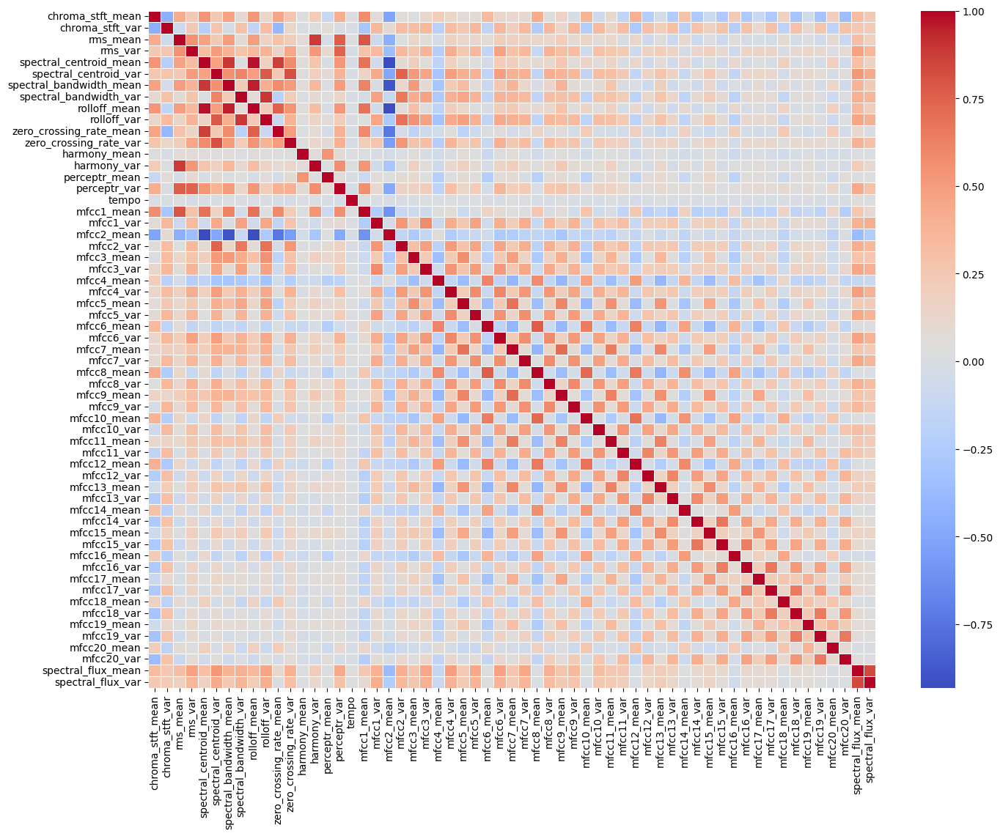

In [ ]:
# Plotting correlation matrix with the added spectral flux data
plt.figure(figsize=(16, 12))

corrie = df.drop(["label", "filename", "length"], axis = 1).corr()
sns.heatmap(corrie, linewidths=0.5, fmt=".2f", cmap="coolwarm")
plt.show()

# Preprocessing our data(3 second music)

In [22]:
df.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label,spectral_flux_mean,spectral_flux_var
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues,1.457924,2.211208
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues,1.367019,1.798489
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,...,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues,1.366841,2.654304
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,...,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues,1.316469,2.205472
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,...,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues,1.303894,2.002127


In [ ]:
# Scaling data with minmax scaler which puts all numeric data between range 0 and 1
from sklearn.preprocessing import MinMaxScaler

X = df.drop(["label", "length", "filename"], axis = 1)
cols = X.columns
Y = df["label"]

minmax_scale = MinMaxScaler()
X = minmax_scale.fit_transform(X)
X = pd.DataFrame(X, columns= cols)

In [ ]:
# Splitting data to train, test and validation
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size = .2,
                                                    random_state = 32)
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train,
                                                   test_size = .2, random_state = 32)

# Reshaping labels from 1 dimenstion to 2 dimention for sklearn's onehotencoder
y_train = y_train.values.reshape(-1, 1)
y_val = y_val.values.reshape(-1, 1)
y_test = y_test.values.reshape(-1, 1)

In [ ]:
# Converting labels to their onehot representations
onehot = OneHotEncoder()
y_train = onehot.fit_transform(y_train).toarray()
y_val = onehot.transform(y_val).toarray()
y_test = onehot.transform(y_test).toarray()

In [26]:
# Making sure all data types are float32, this is necessary since it 
# can cause problems later on when fitting data

x_train = tf.cast(x_train, dtype = tf.float32)
x_val = tf.cast(x_val, dtype = tf.float32)
x_test = tf.cast(x_test, dtype = tf.float32)

y_train = tf.cast(y_train, dtype = tf.float32)
y_val = tf.cast(y_val, dtype = tf.float32)
y_test = tf.cast(y_test, dtype = tf.float32)

# Testing calassification performance on different models

#### Convelutional Neural Network (CNN)

In [ ]:
# Defining a CNN model with tensorflow
cnn_model = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(59, 1, )),
    tf.keras.layers.Conv1D(64, 7, activation="relu"),
    tf.keras.layers.MaxPool1D(pool_size=2),
    tf.keras.layers.Dropout(.1),
    tf.keras.layers.Conv1D(64, 5, activation="relu"),
    tf.keras.layers.MaxPool1D(pool_size=2),
    tf.keras.layers.Dropout(.1),
    tf.keras.layers.Conv1D(128, 5, activation="relu"),
    tf.keras.layers.Flatten(),

    tf.keras.layers.Dense(128, activation="relu"),
    tf.keras.layers.Dense(64, activation="relu"),
    tf.keras.layers.Dense(32, activation="relu"),
    tf.keras.layers.Dropout(.3),
    tf.keras.layers.Dense(10, activation="softmax"),
])

cnn_model.compile(loss = "categorical_crossentropy",
              optimizer = tf.keras.optimizers.Adam(),
              metrics = ["accuracy"])

In [28]:
model_fit = cnn_model.fit(x_train, y_train, epochs = 45,
                validation_data=(x_val, y_val))

Epoch 1/45
200/200 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.1331 - loss: 2.2567 - val_accuracy: 0.3702 - val_loss: 1.7556
Epoch 2/45
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.3556 - loss: 1.7439 - val_accuracy: 0.4296 - val_loss: 1.5114
Epoch 3/45
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4211 - loss: 1.5383 - val_accuracy: 0.5003 - val_loss: 1.3785
Epoch 4/45
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4711 - loss: 1.4191 - val_accuracy: 0.5578 - val_loss: 1.2405
Epoch 5/45
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5133 - loss: 1.3204 - val_accuracy: 0.5385 - val_loss: 1.2598
Epoch 6/45
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5489 - loss: 1.2656 - val_accuracy: 0.6435 - val_loss: 1.0919
Epoch 7/45
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5855 - loss: 1.1639 - val_accuracy: 0.6510 - val_loss: 1.0151
Epoch 8/45
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6186 - loss: 1.1190 - val_accuracy: 0.

In [29]:
result_df = pd.DataFrame(model_fit.history)
result_df.head()

,accuracy,loss,val_accuracy,val_loss
0,0.195996,2.136823,0.370231,1.755591
1,0.378852,1.690946,0.429644,1.511410
2,0.433130,1.518938,0.500313,1.378498
3,0.481777,1.401515,0.557849,1.240459
4,0.525888,1.317834,0.538462,1.259821


Text(0.5, 0, 'Epoch')

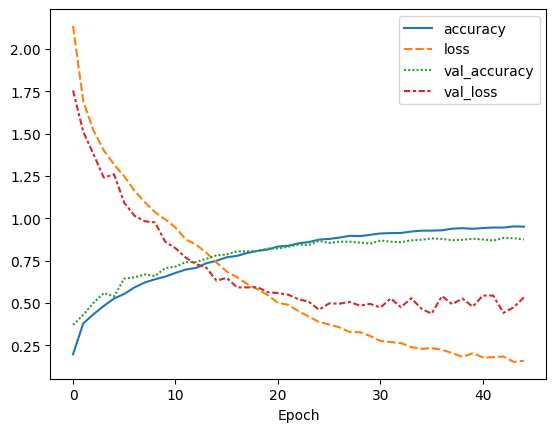

In [30]:
# Graph of train and validation performance over epochs
# Validation loss, begins to worsen not long after epoch 40
sns.lineplot(result_df)
plt.xlabel("Epoch")

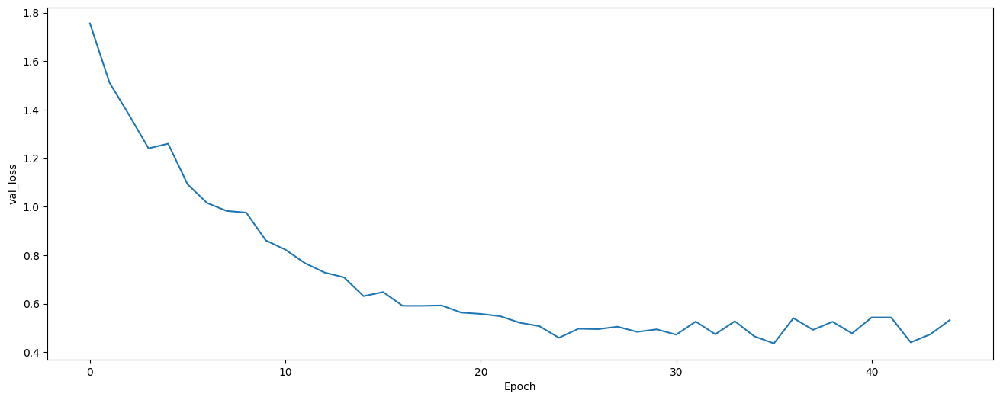

In [31]:
plt.figure(figsize=(16, 6))
sns.lineplot(y=result_df["val_loss"], x= model_fit.epoch)
plt.xlabel("Epoch")
plt.show()

In [32]:
# CNN model evaluation
cnn_model.evaluate(x_test, y_test)

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8608 - loss: 0.5039


[0.5130048990249634, 0.8778778910636902]

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


<Axes: >

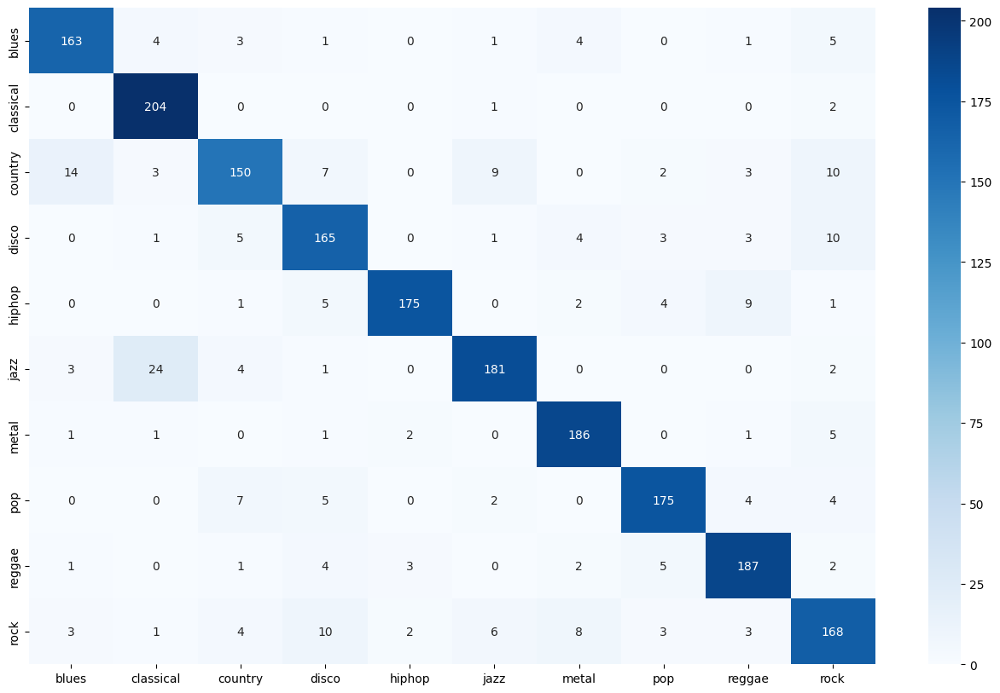

In [33]:
# Confusion Matrix of the CNN model
y_true = np.argmax(y_test, 1)
y_pred = cnn_model.predict(x_test)
y_pred = np.argmax(y_pred, 1)

plt.figure(figsize = (16, 10))
labels = ["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"]
conf_matrix = confusion_matrix(y_pred = y_pred, y_true = y_true)
sns.heatmap(conf_matrix, cmap="Blues", annot=True,
            xticklabels = labels,
           yticklabels=labels,
            fmt='g')

In [73]:
# Combining all features and labels for cross validation in sklearn models
# while keeping a seperate test set for final model evaluation
train_val_features = np.vstack((x_train, x_val))
train_val_labels = np.vstack((y_train, y_val))

# Transforming labels back from onehot encoded form
text_labels = onehot.inverse_transform(train_val_labels)

#### SVM

In [74]:
from sklearn.svm import SVC

svc = SVC(C = 230, gamma=5)

cv_scores = cross_val_score(estimator= svc, X=train_val_features, y= text_labels, cv=10)
print("svm cross validation scores:", cv_scores)

svm cross validation scores: [0.9375     0.93875    0.94242804 0.93491865 0.93366708 0.93617021
 0.92866083 0.94242804 0.93366708 0.94117647]


In [36]:
# Fitting model on all features excluding test set
svc.fit(train_val_features, text_labels)

# Evaluating model on test set
svc_pred = svc.predict(x_test)
svc_accuracy = accuracy_score(y_true=onehot.inverse_transform(y_test), y_pred=svc_pred)
print("test accuracy: ", svc_accuracy)

test accuracy:  0.9344344344344344


#### K-nearest neighbors

In [75]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=4, weights="distance", p = 1.1) 

cv_scores = cross_val_score(estimator= knn, X=train_val_features, y= text_labels, cv=10)
print("knn cross validation scores:", cv_scores)

knn cross validation scores: [0.94375    0.94125    0.94743429 0.9436796  0.93491865 0.93366708
 0.93992491 0.95369212 0.92365457 0.93491865]


In [76]:
knn.fit(train_val_features, train_val_labels)

knn_pred = knn.predict(x_test)
knn_accuracy = accuracy_score(y_true=y_test, y_pred=knn_pred)
print("test accuracy: ", knn_accuracy)

test accuracy:  0.9294294294294294


# Using tree based models with YDF(Yggdrasil Decision Forests)

In [39]:
# Importing models
from ydf import RandomForestLearner, GradientBoostedTreesLearner

In [ ]:
# Preparing train and test features for ydf
# Note: In ydf, we don't need to seperate labels and features when splitting our dataset.
# We only need to split the data into train and test sets and giving the label section name
# of dataset (label column name) as argument to the learner as you will see below

df_total = df.drop(["filename", "length"], axis = 1)
df_total["label"] = df_total["label"].astype("category").cat.codes.values

df_test = df_total.sample(frac=0.2, random_state=42)
df_train = df_total.drop(df_test.index)

#### Random Forests

In [41]:
# Defining a random forest model and applying Cross Validation 
# to check how the model does on different folds of data
# Note that ydf returns a result from Cross Validation across all folds
rfc_model = RandomForestLearner(label="label", 
                                categorical_algorithm="RANDOM", 
                                num_trees=600)
rfc_model.cross_validation(ds= df_total, folds=10)

Label \ Pred,0,1,2,3,4,5,6,7,8,9
0,899,0,51,19,8,17,10,0,10,40
1,3,970,7,5,0,55,2,2,3,7
2,33,6,859,19,8,36,4,54,34,75
3,6,0,20,856,29,3,8,31,28,68
4,6,0,0,20,874,1,9,16,26,1
5,20,18,33,5,2,885,2,11,10,37
6,24,0,4,19,12,2,943,0,3,54
7,0,0,2,10,26,0,0,847,26,6
8,9,1,11,26,37,0,6,27,855,34
9,0,3,10,20,2,1,16,12,5,676


In [42]:
rfc_model = rfc_model.train(df_train)

Train model on 7992 examples
Model trained in 0:00:05.595603


##### YDF evaluation gives so much information such as:
<ul style="font-size: 15px;">
<li>Accuracy</li>
<li>PR-AUC (Area Under the Precision-Recall Curve) score | more info at : <a href = "https://short-link.me/P1oI">YDF PR_AUC</a></li>
<li>AUC (Area Under the Curve of the ROC) score | more info at : <a href = https://short-link.me/RwVp>YDF AUC</a></li>
<li>Loss</li>
<li>Confusion Matrix</li>
<ul>

In [43]:
# We can evaluate the model like this

rfc_eval = rfc_model.evaluate(df_test)
rfc_eval

Label \ Pred,0,1,2,3,4,5,6,7,8,9
0,177,0,12,1,5,2,1,0,3,4
1,2,199,0,2,0,10,0,0,1,0
2,12,0,159,4,2,7,1,8,7,19
3,5,0,1,167,3,0,1,4,11,16
4,1,0,0,7,189,0,1,1,6,0
5,4,4,10,1,1,172,0,0,3,10
6,2,0,0,3,5,0,197,0,1,10
7,0,0,1,4,5,1,0,163,4,1
8,5,0,2,6,8,0,1,1,174,6
9,0,0,1,4,0,0,2,3,1,131


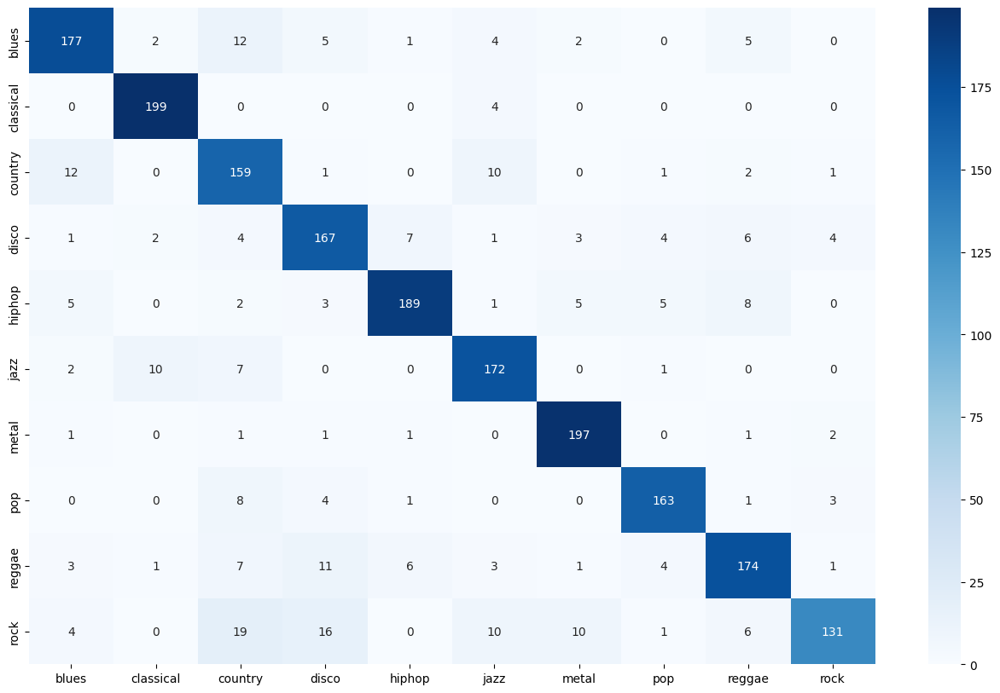

In [44]:
# Here's a more informative and appealing confusion matrix from the model evaluation

plt.figure(figsize = (16, 10))
labels = ["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"]
sns.heatmap(rfc_eval.confusion_matrix.matrix, annot = True,
            xticklabels = labels, yticklabels=labels,
            cmap = "Blues", fmt='g');

#### Gradient Boosted Decision Trees (GBT)

In [45]:
gbt_model = GradientBoostedTreesLearner(label = "label",
                                        early_stopping = "NONE",
                                        num_trees= 600,
                                        categorical_algorithm="RANDOM"
                                        )
gbt_model.cross_validation(ds = df_total, folds = 10)

Label \ Pred,0,1,2,3,4,5,6,7,8,9
0,910,0,19,8,5,7,4,0,11,15
1,3,963,1,3,1,27,1,2,2,6
2,24,2,922,15,6,28,8,24,12,37
3,8,0,6,910,13,0,8,24,10,21
4,7,0,0,12,929,0,5,13,14,5
5,16,27,27,4,3,931,1,6,7,19
6,12,0,0,7,5,1,945,0,2,28
7,0,1,4,14,15,1,0,909,11,1
8,11,1,6,12,19,1,3,16,926,8
9,9,4,12,14,2,4,25,6,5,858


In [46]:
gbt_model = gbt_model.train(ds=df_train)

Train model on 7992 examples
Model trained in 0:00:56.688079


In [47]:
gbt_eval = gbt_model.evaluate(df_test)
gbt_eval

Label \ Pred,0,1,2,3,4,5,6,7,8,9
0,191,0,4,0,4,0,0,0,1,2
1,0,201,0,2,0,8,0,0,1,0
2,5,0,171,2,3,7,2,1,3,5
3,1,0,2,180,3,0,1,1,3,4
4,0,0,0,4,201,0,1,1,2,0
5,3,2,4,1,1,175,0,0,0,4
6,1,0,0,1,1,0,197,0,0,6
7,0,0,0,1,1,0,0,176,1,1
8,5,0,2,5,4,1,0,1,198,2
9,2,0,3,3,0,1,3,0,2,173


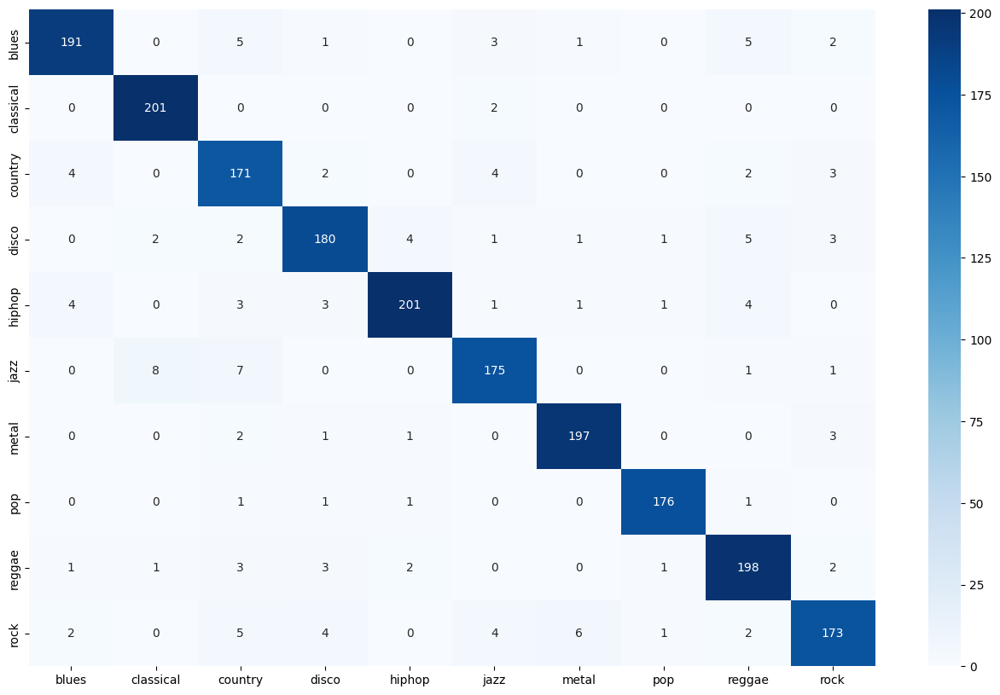

In [48]:
plt.figure(figsize = (16, 10))
labels = ["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"]
sns.heatmap(gbt_eval.confusion_matrix.matrix, annot = True,
            xticklabels = labels, yticklabels=labels,
            cmap = "Blues", fmt='g');

In [ ]:
# Analysis of the Gradient Boosted Decision Trees model on test set to check the Variable Importance
gbt_model.analyze(df_test, partial_depepence_plot = False, conditional_expectation_plot = False)

In [50]:
# We can save our model like this
gbt_model.save("Music_GBT")

# Examining models
<p style="font-size:15px;">It would be a good idea to use other metrics to compare our models such as Recall, Precision and F1 score. Then, we can finalize our decision and choose the best model(s).</p>

In [51]:
from sklearn.metrics import recall_score, precision_score, f1_score

In [78]:
def eval_score(y_true, y_pred, average):
    """
    Evaluates this four metrics using scikit learn: Accuracy, Recall Score, Precision Score, F1 Score
    For more info on each metric visit : <a href = "https://scikit-learn.org/stable/api/sklearn.metrics.html#module-sklearn.metrics">sklearn.metrics</a>
    
    Parameters
    ----------
    y_true : 1d array-like, or label indicator array / sparse matrix
        Ground truth (correct) labels.

    y_pred : 1d array-like, or label indicator array / sparse matrix
        Predicted labels, as returned by a classifier.
    
    average : {'micro', 'macro', 'samples', 'weighted', 'binary'} or None
    """
    print("accuracy:")
    print(accuracy_score(y_true=y_true, y_pred= y_pred), "\n")

    print("recall score:")
    print(recall_score(y_true = y_true, y_pred=y_pred, average=average), "\n")

    print("precision score:")
    print(precision_score(y_true = y_true, y_pred=y_pred, average=average), "\n")

    print("f1 score:")
    print(f1_score(y_true = y_true, y_pred=y_pred, average=average), "\n")

#### CNN Result

In [66]:
index_labels = np.argmax(y_test, axis= 1) # Taking index of each label from test labels set as it is onehot encoded 
cnn_pred = cnn_model.predict(x_test).argmax(axis = 1) 

eval_score(y_true= index_labels, y_pred=cnn_pred, average= "weighted")

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
accuracy:
0.8778778778778779 

recall score:
0.8778778778778779 

precision score:
0.8788965719091749 

f1 score:
0.8772596046832914 



#### Random Forest Result

In [67]:
rfc_pred = rfc_model.predict(df_test)
rfc_pred = rfc_pred.argmax(axis=1)

eval_score(y_true=df_test["label"], y_pred=rfc_pred, average="weighted")

accuracy:
0.8648648648648649 

recall score:
0.8648648648648649 

precision score:
0.86892406052426 

f1 score:
0.8639132394955431 



#### SVM Result

In [68]:
text_labels = onehot.inverse_transform(y_test)

eval_score(y_true= text_labels, y_pred=svc_pred, average= "weighted")

accuracy:
0.9344344344344344 

recall score:
0.9344344344344344 

precision score:
0.9350435948616367 

f1 score:
0.9343342226664996 



#### Gradient Boosted Decision Trees Result

In [70]:
gbt_pred = gbt_model.predict(df_test)
gbt_pred = gbt_pred.argmax(axis=1)

eval_score(y_true=df_test["label"], y_pred=gbt_pred, average="weighted")

accuracy:
0.9324324324324325 

recall score:
0.9324324324324325 

precision score:
0.9330031165712193 

f1 score:
0.9324102596683049 



#### K-nearest neighbors Result

In [79]:
eval_score(y_true=y_test, y_pred=knn_pred, average="weighted")

accuracy:
0.9294294294294294 

recall score:
0.9294294294294294 

precision score:
0.9543647962896602 

f1 score:
0.9413578972277753 



# Performance Table

<table>
  <tr>
    <th rowspan="2">Metrics</th>
    <th colspan="5">Model</th>
  </tr>
  <tr>
    <th>CNN</th>
    <th>Random Forest</th>
    <th title="Gradient Boosted Trees">Gradient Boosted Trees</th>
    <th>SVM</th>
    <th>KNN</th>
  </tr>
  <tr>
    <td>Accuracy</td>
    <td>87.79%</td>
    <td>86.49%</td>
    <td>93.24%</td>
    <td>93.44%</td>
    <td>92.94%</td>
  </tr>
  <tr>
    <td>Precision</td>
    <td>87.89%</td>
    <td>86.89%</td>
    <td>93.30%</td>
    <td>93.50%</td>
    <td>95.44%</td>
  </tr>
  <tr>
    <td>Recall</td>
    <td>87.79%</td>
    <td>86.49%</td>
    <td>93.24%</td>
    <td>93.44%</td>
    <td>92.94%</td>
  </tr>
  <tr>
    <td>F1 Score</td>
    <td>87.73%</td>
    <td>86.39%</td>
    <td>93.24%</td>
    <td>93.43%</td>
    <td>94.14%</td>
  </tr>
</table>


# Conclusion
<p style="font-size:15px;">We looked at different models for music genre classification using extracted audio features such as MFCCs and zero crossing rate. The reason that the CNN model did worse compared to other models is that CNNs are designed for spatial data so when presented with extracted features(like those in music) which lack spatial relationships, they struggle. However, traditional models such as SVM, KNN and ensemble models don't look for spatial locality like CNNs do and use other techniques (for example SVM finds a hyperplane) and that's why they do very well with these kind of features. So, now by looking at the performance table, we can confidently say that SVM and KNN are the most suitable for this classification task.</p>